In [1]:
#General
import re
import pandas as pd
import numpy as np
import string
import os
import string
from os import listdir
import itertools
import gensim
import random

#Nltk processes
import nltk
import numpy
import string
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
from nltk.corpus import PlaintextCorpusReader
from collections import Counter
from nltk.probability import FreqDist
from nltk.corpus import stopwords



#WordNet
from nltk.corpus import wordnet as wn
#Sentiment, SentiWordNet
from nltk.corpus import sentiwordnet as swn
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA #VADER
from nltk.sentiment import sentiment_analyzer, util
from nltk.sentiment import SentimentAnalyzer
from textblob import TextBlob

#Classifers


from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import roc_curve, roc_auc_score

from nltk import word_tokenize
from nltk.sentiment.util import mark_negation
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.base import TransformerMixin

from nltk import word_tokenize
from nltk.classify import NaiveBayesClassifier
from nltk.sentiment import SentimentAnalyzer
from nltk.sentiment.util import extract_unigram_feats, mark_negation

#Lemmatization & Stemming
from nltk.corpus import wordnet as wn
from nltk.stem import WordNetLemmatizer

#Visualisation
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from PIL import Image
import numpy as np
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns



/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/gensim/similarities/__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [4]:
#Loding the raw data
data = pd.read_csv("food_delivery_reviews.csv", header=None)
data.drop([0], inplace = True)
data.drop([0, 1, 2, 5, 6, 8, 9, 10], axis = 1,inplace= True)
data.rename(columns = {3 : 'raw_review', 4 : 'score', 7: 'date', 11:'app_name'}, inplace = True)
data.reset_index(inplace=True, drop = True)
#Tagging reviews : positive for the rates "1" and "2", positive for the rates "3", "4", "5"
real_sentiment_tag = []
for i in range(data.shape[0]):
    if data.iloc[i]['score'] == "1" or data.iloc[i]['score'] == "2":
        real_sentiment_tag.append(0)
    if data.iloc[i]['score'] == "3" or data.iloc[i]['score'] == "4" or data.iloc[i]['score'] == "5":
        real_sentiment_tag.append(1)
        
data['real_tag'] = real_sentiment_tag

print(data.shape)
data

(15200, 5)


,raw_review,score,date,app_name,real_tag
0,Advertising notifications cannot be disabled. ...,1,2021-04-06 00:39:38,com.ubercab.eats,0
1,Uninstalled and reinstalled to try to fix a UI...,1,2021-04-06 00:36:58,com.ubercab.eats,0
2,It's not working,1,2021-04-06 00:29:05,com.ubercab.eats,0
3,Negative stars need to become a thing. These j...,1,2021-04-06 00:25:32,com.ubercab.eats,0
4,Their customer service is absolute garbage. If...,1,2021-04-06 00:08:22,com.ubercab.eats,0
...,...,...,...,...,...
15195,free delivery for first 14 orders 20% off on p...,5,2021-03-06 15:44:26,com.deliveroo.orderapp,1
15196,perfect,5,2021-03-06 15:24:35,com.deliveroo.orderapp,1
15197,excellent service,5,2021-03-06 15:20:30,com.deliveroo.orderapp,1
15198,"easy to order, all good",5,2021-03-06 15:01:37,com.deliveroo.orderapp,1


In [37]:
data.iloc[0]['date'], data.iloc[15199]['date']

('2021-04-06 00:39:38', '2021-03-06 13:33:12')

In [5]:
#Getting rid of all non-alphanumeric characters, numbers, and seperation of the data according to the app
def data_cleaning(review_data, topic_or_sentiment, names_of_the_apps):
    global stop_words, extra_stop_words
    stop_words = stopwords.words("english")
    extra_stop_words = ["arent", "werent", "wasnt", "doesnt", "dont", "didnt", "wont", "isnt", "hasnt", "havent", "hadnt",\
                            "couldnt", "shouldnt", "cant", "lets", "mustnt", "im", "youre", "ive", "shouldve" "shes", "hes", "its"\
                         "theyre", "st", "nd", "rd", "th", "gonna","wouldnt", "id", "youd", "youve", "weve", "theyve", \
                       "wanna", "thats", "hi" ] + names_of_the_apps
    sentiment_stop_words = ["theyre", "st", "nd", "rd", "th", "gonna","wouldnt", "id", "youd", "youve", "weve", "theyve", \
                       "wanna", "thats", "hi", "lets", "ive", "shes", "hes", "its", "im",   ] + names_of_the_apps
    
    global stemmer, lemmatizer
    stemmer = nltk.PorterStemmer()
    lemmatizer = nltk.WordNetLemmatizer()
    
    #For Topic Modelling
    if topic_or_sentiment == 'topic':
        cleaned_reviews = []
        for review in review_data['raw_review']:
            is_noun = lambda pos: pos[:2] == 'NN'
            tokenized = word_tokenize(str(review).lower())
            all_nouns = [word for (word, pos) in nltk.pos_tag(tokenized) if is_noun(pos)]
            process1 = [re.sub(r'[`\-=~!@#$%^&*()_+\[\]{};\\\:"|<,./<>?]',"", w) for w in all_nouns]
            process2 = [re.sub("[^a-zA-Z\d\s:]", "", w) for w in process1]
            process3 = [re.sub("[\d-]", "", w) for w in process2]
            extra_stop_words.append("app")
            process4 = [w for w in process3 if not w in extra_stop_words + stop_words]
            process5 = [w for w in process4 if len(w) > 2]
            process6 = [stemmer.stem(lemmatizer.lemmatize(w)) for w in process5]
            #joined = " ".join(process6) 
            cleaned_reviews.append(process6)
        return cleaned_reviews
    
    #For Sentiment Analysis
    if topic_or_sentiment == 'sentiment':
        cleaned_reviews = []
        for review in review_data['raw_review']:
            process1 = [re.sub(r'[`\-=~!@#$%^&*()_+\[\]{};\\\:"|<,./<>?]',"", w) for w in word_tokenize(str(review).lower())]
            process2 = [re.sub("[^a-zA-Z\d\s:]", "", w) for w in process1]
            process3 = [re.sub("[\d-]", "", w) for w in process2]
            process4 = [w for w in process3 if not w in  stop_words + sentiment_stop_words + names_of_the_apps]
            process5 = [w for w in process4 if len(w) > 2]
            cleaned_reviews.append( " ".join(process5))
        tokenized = [word_tokenize(text) for text in  cleaned_reviews]
        text = [" ".join(text) for text in tokenized]
        return text
        



In [6]:
#Adding cleaned data to the dataframe for topic modelling
review_df = data.copy()
review_df['cleaned_tm'] = data_cleaning(data, 'topic' , ["ubereats", "deliveroo", "justeat", "zomato"])
check = []

#Adding clenaed data for sentiment analysis
review_df['cleaned_sa'] = data_cleaning(data, 'sentiment' , ["ubereats", "uber", "eats", "deliveroo", "justeat", "just", "eat", "zomato"])


#Cleanning the reviews with one word or empty cleaned text (The reviews without context)
for i in range(review_df.shape[0]): #Empty cleaned reviews are deleted
    if review_df["cleaned_tm"][i] == []:
        check.append(0)
    elif len(str(review_df['raw_review'][i]).split()) <=1:
        check.append(0)
    else:
        check.append(1)
review_df['check'] = check

review_df = review_df[review_df['check'] == 1]
review_df.drop(['check'], axis = 1, inplace = True)
review_df.reset_index(inplace = True, drop = True)

print(review_df.shape)
review_df

(12155, 7)


,raw_review,score,date,app_name,real_tag,cleaned_tm,cleaned_sa
0,Advertising notifications cannot be disabled. ...,1,2021-04-06 00:39:38,com.ubercab.eats,0,"[advertis, notif, phone]",advertising notifications disabled permanently...
1,Uninstalled and reinstalled to try to fix a UI...,1,2021-04-06 00:36:58,com.ubercab.eats,0,"[issu, payment, option, messag, card, option]",uninstalled reinstalled try fix issue let add ...
2,Negative stars need to become a thing. These j...,1,2021-04-06 00:25:32,com.ubercab.eats,0,"[star, thing, joker, item, qualiti, assur, tim...",negative stars need become thing jokers charge...
3,Their customer service is absolute garbage. If...,1,2021-04-06 00:08:22,com.ubercab.eats,0,"[custom, servic, garbag, food, option, work, f...",customer service absolute garbage food orderin...
4,Not a problem with app itself but it takes for...,1,2021-04-05 23:53:40,com.ubercab.eats,0,"[problem, delay, food]",problem app takes forever around delays get food
...,...,...,...,...,...,...,...
12150,Good offers - On time delivery,5,2021-03-06 19:09:16,com.deliveroo.orderapp,1,"[offer, time, deliveri]",good offers time delivery
12151,good service,5,2021-03-06 18:53:45,com.deliveroo.orderapp,1,[servic],good service
12152,free delivery for first 14 orders 20% off on p...,5,2021-03-06 15:44:26,com.deliveroo.orderapp,1,"[deliveri, order, pizza, hut, spend, spend, deal]",free delivery first orders pizza hut spend spe...
12153,excellent service,5,2021-03-06 15:20:30,com.deliveroo.orderapp,1,[servic],excellent service


# Explanatory Analysis

In [7]:
#Shuffle df 
review_df = review_df.sample(frac=1).reset_index(drop=True)
review_df.reset_index(inplace = True, drop = True)
review_df

,raw_review,score,date,app_name,real_tag,cleaned_tm,cleaned_sa
0,Service charge too dear. Normally quick delive...,3,2021-03-29 19:50:03,com.ubercab.eats,1,"[servic, charg, deliveri]",service charge dear normally quick delivery ap...
1,Works fine,5,2021-03-20 21:31:18,com.deliveroo.orderapp,1,[work],works fine
2,Good app and company but sometimes very rarely...,3,2021-04-01 03:57:14,com.ubercab.eats,1,"[compani, driver, food]",good app company sometimes rarely drivers suck...
3,The checkout page is really slow,3,2021-03-31 18:06:41,com.justeat.app.uk,1,"[checkout, page]",checkout page really slow
4,Offers make it better than just eat.,4,2021-03-20 19:40:53,com.deliveroo.orderapp,1,"[offer, eat]",offers make better
...,...,...,...,...,...,...,...
12150,Worst service. I have placed my order and wait...,1,2021-03-25 14:13:21,com.deliveroo.orderapp,0,"[servic, order, hour, order, custom, servic, s...",worst service placed order waiting hour delive...
12151,"Good selection, but delivery is expensive and ...",2,2020-08-21 13:29:59,com.deliveroo.orderapp,0,"[select, deliveri, checkout, everyth]",good selection delivery expensive warned check...
12152,It is fraud sales... Items which u ordered wil...,1,2021-04-04 17:31:08,com.application.zomato,0,"[fraud, sale, item, order, anyth, order, punja...",fraud sales items ordered delivered dont order...
12153,I pay for the food and they shown it delivered...,1,2021-03-11 14:01:04,com.deliveroo.orderapp,0,"[pay, food, anyth]",pay food shown delivered get anything


In [8]:
#Tokanization for further analysis
tokenized_reviews = [word_tokenize(review) for review in review_df['cleaned_sa']]
stop_words_removed = []
for tokenized_review in tokenized_reviews:
    for word in tokenized_review:
        if word not in stop_words and word not in extra_stop_words:
            stop_words_removed.append(word)

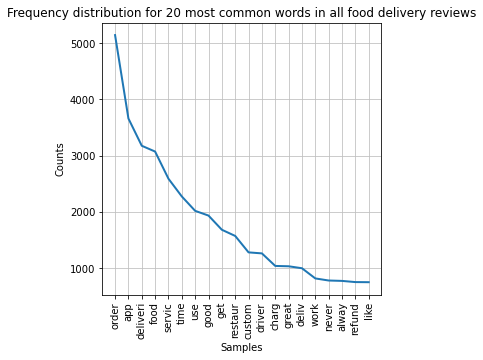

<AxesSubplot:title={'center':'Frequency distribution for 20 most common words in all food delivery reviews'}, xlabel='Samples', ylabel='Counts'>

In [9]:
#Stemming and lemmatization
porter = nltk.PorterStemmer()
stemmed = [porter.stem(word) for word in stop_words_removed]
#Frequency Dist.
fdist = FreqDist(stemmed) 

#FDist Line graph---This was not used in the report
plt.figure(figsize=(5,5))
fdist.plot(20,title='Frequency distribution for 20 most common words in all food delivery reviews') #after stemming



/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


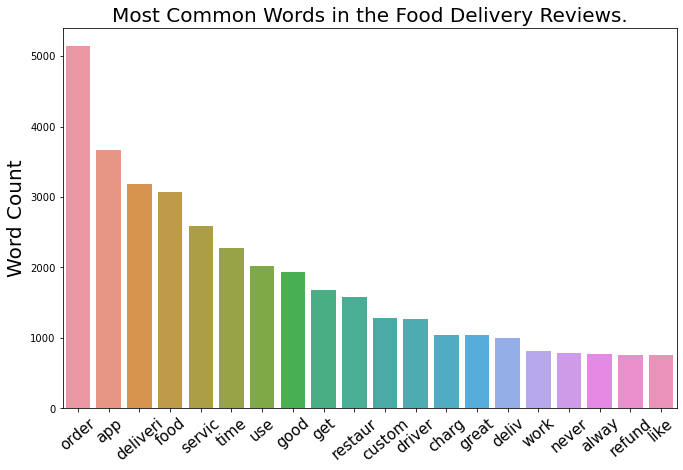

In [10]:
######Figure 2 in the report
#FDist Bar Graph
most_common_words = [x[0] for x in fdist.most_common(20)]
counts = [x[1] for x in fdist.most_common(20)]
plt.figure(figsize=(11,7))
plot = sns.barplot(np.arange(20), counts) #width=0.35)
plt.ylabel('Word Count',fontsize=20)
plt.xticks(np.arange(20), most_common_words, fontsize=15, rotation=40)
plt.title('Most Common Words in the Food Delivery Reviews.', fontsize=20)
plt.show()

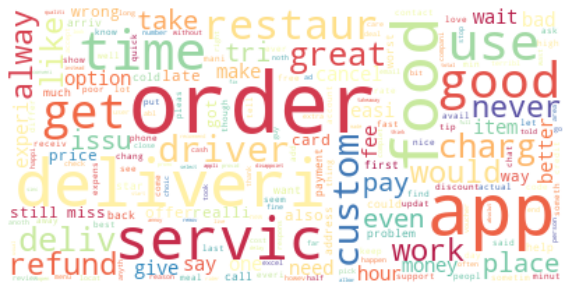

In [9]:
######A.1 in the report
#Word Cloud Unigrams
cloud2 = WordCloud(max_font_size=60,background_color='white', colormap = 'Spectral').generate_from_frequencies(fdist)
plt.figure(figsize=(10,10))
plt.imshow(cloud2, interpolation='bilinear')
plt.axis('off')
plt.show()


In [11]:
#Detecting Bigrams
x = list(review_df["cleaned_sa"])
tokenized = [word_tokenize(text) for text in x]
text = [" ".join(text) for text in tokenized]
bigrams = [b for l in text for b in zip(l.split(" ")[:-1], l.split(" ")[1:])]
freq_bigrams = nltk.FreqDist(bigrams)


/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


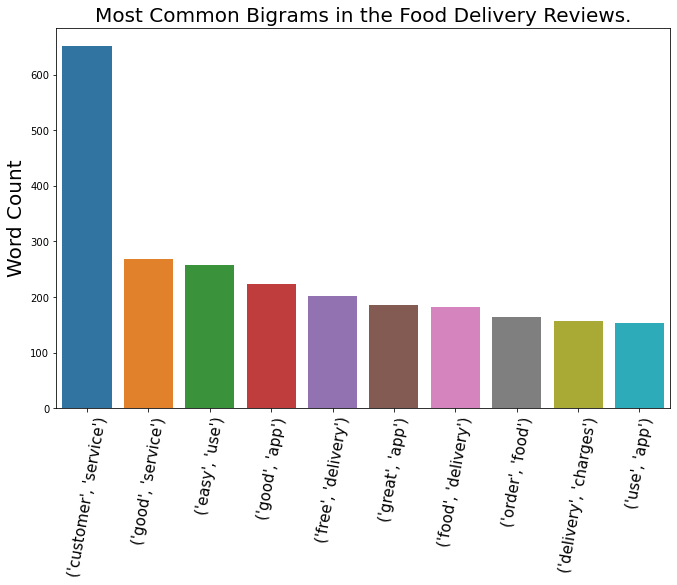

In [12]:
######Figure 3 in the report
#FDist Bar Graph
most_common_words = [x[0] for x in freq_bigrams.most_common(10)]
counts = [x[1] for x in freq_bigrams.most_common(10)]
plt.figure(figsize=(11,7))
plot = sns.barplot(np.arange(10), counts) #width=0.35)
plt.ylabel('Word Count',fontsize=20)
plt.xticks(np.arange(10), most_common_words, fontsize=15, rotation=80)
plt.title('Most Common Bigrams in the Food Delivery Reviews.', fontsize=20)
plt.show()

# Sentiment Analyzers

/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


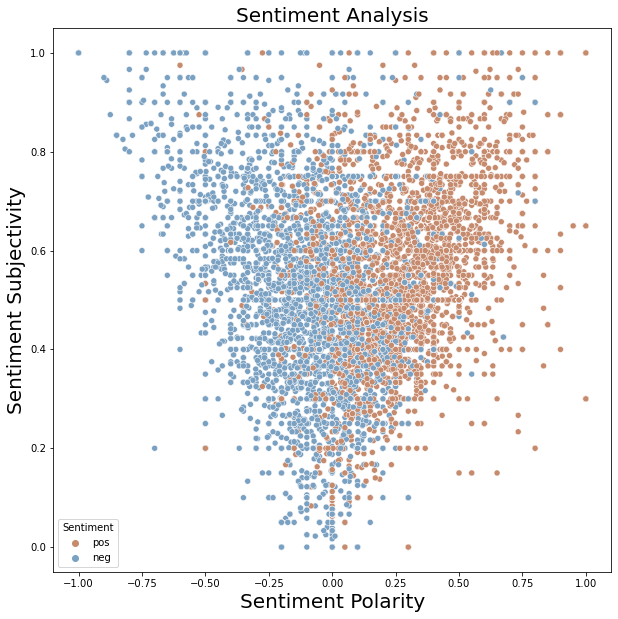

In [13]:
######A.2 in the report
#Sentiment Visualization based on Vader
sid = SIA()
# Add VADER metrics to dataframe
sentiment_df = review_df.copy()
sentiment_df['compound']= [sid.polarity_scores(v)['compound'] for v in review_df['cleaned_sa']]
sentiment_df['neg'] = [sid.polarity_scores(v)['neg'] for v in review_df['cleaned_sa']]
sentiment_df['neu'] = [sid.polarity_scores(v)['neu'] for v in review_df['cleaned_sa']]
sentiment_df['pos'] = [sid.polarity_scores(v)['pos'] for v in review_df['cleaned_sa']]

#TextBlob Descriptions
blob_decription = [TextBlob(desc) for desc in review_df['cleaned_sa']]

#Sentiment Elements
sentiment_df['tb_Pol'] = [b.sentiment.polarity for b in blob_decription]
sentiment_df['tb_Subj'] = [b.sentiment.subjectivity for b in blob_decription]

# Categorize Based on positive or Negative
conditions = [(sentiment_df['compound'] >= 0.3),
    (sentiment_df['compound'] <= 0.3),(sentiment_df['compound'] == 0)]

# create a list of the values we want to assign for each condition
values = ['pos', 'neg', 'neu']

# create a new column and use np.select to assign values to it using our lists as arguments
sentiment_df['Sentiment'] = np.select(conditions, values)

#Visualization
plt.figure(figsize=(10,10))
g = sns.scatterplot(sentiment_df['tb_Pol'], sentiment_df['tb_Subj'], hue = sentiment_df['Sentiment'], edgecolor='white', palette="twilight_shifted_r")
plt.xlabel('Sentiment Polarity', fontsize=20)
plt.ylabel('Sentiment Subjectivity', fontsize=20)
plt.title("Sentiment Analysis", fontsize=20)
plt.show()

In [14]:
def sentiment_analysis_vader(text):
    sid = SIA()
    #vader_tag = []
    score = sid.polarity_scores(text)
    if score['compound'] <= 0.3:
        return 0
    else:
        return 1
        

In [15]:
#SENTIMENT ANALYSIS USING SENTIWORDNET (USING POS TAGGING)
def wordnet_pos_tag(tag):
    if tag.startswith('J'):
        return wn.ADJ
    elif tag.startswith('N'):
        return wn.NOUN
    elif tag.startswith('R'):
        return wn.ADV
    elif tag.startswith('V'):
        return wn.VERB
    return None

def swn_sentiment_analysis(sentence):
    sentiment = 0.0
    tokens_count = 0
    sentiwordnet_tag = []
    tagged_sentence = nltk.pos_tag(word_tokenize(sentence))
    for word, tag in tagged_sentence:
        wn_tag = wordnet_pos_tag(tag)

        if wn_tag not in (wn.NOUN, wn.ADJ, wn.ADV):
            continue
        lemma = lemmatizer.lemmatize(word, pos=wn_tag)
        if not lemma:
            continue
        synsets = wn.synsets(lemma, pos=wn_tag)
        if not synsets:
            continue
        # Take the first most common sense
        synset = synsets[0]
        swn_synset = swn.senti_synset(synset.name())
        sentiment += swn_synset.pos_score() - swn_synset.neg_score()
        tokens_count += 1
            
    #Default to positive or negative
    if not tokens_count:
        return 0

    # greater than 0 => positive sentiment
    if sentiment >= 0:
        return 1

    # negative sentiment
    return 0

        


In [16]:
#SENTIMENT PREDICTION

#Getting tthe binary vectors
def getBinaryVector(review, features):
    # 1s and 0s to indicate whether a word is present in the document
    x = []
    # count does not matter
    review = set(review)

    # go through the features (all words)
    for word in features:
       # check whether the word is present
        if word in review:
            x.append(1)
        else:
            x.append(0)   
    return x

#This function makes the prediction and outputs according to the classifiers specified (custom-built analysers included)   
def sentiment_prediction(data, test_ratio, classifier):
    
    ####SENTIWORDNET AND VADER
    if classifier == "sentiwordnet" or classifier == "vader":
        
        sentiment_data = list(zip(data["cleaned_sa"], data["real_tag"]))
        #%80 for training
        ratio = int(review_df.shape[0]*(1-test_ratio))
        train_X, train_y = zip(*sentiment_data[:ratio])
        # 20% for testing
        test_X, test_y = zip(*sentiment_data[ratio:])
        
        #prediction 
        if classifier == "sentiwordnet":
            pred_y = [swn_sentiment_analysis(text) for text in test_X]
            #print("SentiWordNet accuracy: ", accuracy_score(test_y, pred_y))
            return accuracy_score(test_y, pred_y)
        else:
            pred_y = [sentiment_analysis_vader(text) for text in test_X]
            #print("Vader accuracy: ", accuracy_score(test_y, pred_y))
            return accuracy_score(test_y, pred_y)
           

        
    #####NAIVE BAYES, RANDOM FOREST   
    else:
        #dont forget shuffle
        reviews = [(word_tokenize(str(data.iloc[i]['cleaned_sa'])), data.iloc[i]['real_tag']) for i in range(data.shape[0])]           
        words = []
        for sentence in data['cleaned_sa']:
            for word in word_tokenize(str(data['cleaned_sa'])):
                words.append(word)
                   
        all_words = nltk.FreqDist(words)
        
        # keep all words that appear more than 200 times 
        features = {w for w in all_words.keys() if all_words[w]>200}
        X = []
        y = []

        for (rev, category) in reviews:
            # convert your review into a vector and save it into the feature matrix
            X.append(getBinaryVector(rev, features))

            # save the label for your dependent variable list
            y.append(category)

        X_df = pd.DataFrame(data = X, columns = features)

        # train and test split with sklearn
        X_train, X_test, y_train, y_test = train_test_split(X_df, y, test_size=test_ratio)
        
        ###########
        
        

        # Define a result table as a DataFrame
        result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])

        # Trainning
        for cls in classifier:
            model = cls.fit(X_train, y_train)
            yproba = model.predict_proba(X_test)[::,1]

            fpr, tpr, _ = roc_curve(y_test,  yproba)
            auc = roc_auc_score(y_test, yproba)

            result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                                'fpr':fpr, 
                                                'tpr':tpr, 
                                                'auc':auc}, ignore_index=True)

        # Classifiers as index labels
        result_table.set_index('classifiers', inplace=True)
        
        fig = plt.figure(figsize=(8,6))

        for i in result_table.index:
            plt.plot(result_table.loc[i]['fpr'], 
                     result_table.loc[i]['tpr'], 
                     label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))

        plt.plot([0,1], [0,1], color='orange', linestyle='--')

        plt.xticks(np.arange(0.0, 1.1, step=0.1))
        plt.xlabel("Flase Positive Rate", fontsize=15)

        plt.yticks(np.arange(0.0, 1.1, step=0.1))
        plt.ylabel("True Positive Rate", fontsize=15)

        plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
        plt.legend(prop={'size':13}, loc='lower right')

        plt.show()

        

       



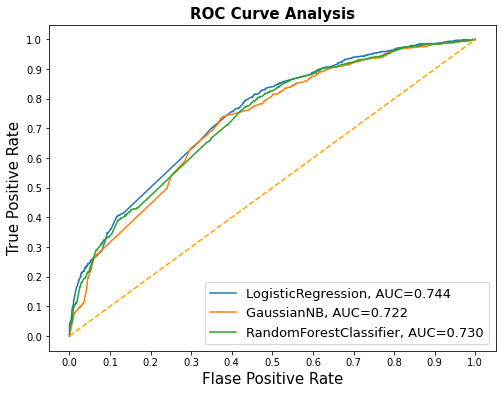

In [17]:
####### Figure 4 in the report
sentiment_prediction(review_df, 0.2, [LogisticRegression(random_state=1234), 
                       GaussianNB(),
                       RandomForestClassifier(random_state=1234)])

In [20]:
#Accuracy of sentiwordnet analyzer
sentiment_prediction(review_df, 0.2, "sentiwordnet")

0.6561085972850679

In [21]:
#Accuracy of VADER analyzer
sentiment_prediction(review_df, 0.2, "vader")

0.6886055121349239

# TOPIC MODELLING

Topic: 0 
Words: 0.158*"food" + 0.104*"time" + 0.088*"order" + 0.054*"deliveri" + 0.046*"driver" + 0.033*"hour" + 0.020*"money" + 0.019*"restaur" + 0.018*"way" + 0.017*"address"
Topic: 1 
Words: 0.145*"order" + 0.047*"option" + 0.046*"card" + 0.037*"payment" + 0.037*"issu" + 0.032*"place" + 0.030*"item" + 0.029*"offer" + 0.021*"menu" + 0.019*"error"
Topic: 2 
Words: 0.164*"deliveri" + 0.050*"order" + 0.050*"restaur" + 0.044*"eat" + 0.043*"charg" + 0.031*"fee" + 0.027*"experi" + 0.022*"rate" + 0.022*"servic" + 0.018*"option"
Topic: 3 
Words: 0.180*"servic" + 0.079*"custom" + 0.028*"restaur" + 0.023*"star" + 0.022*"eat" + 0.020*"order" + 0.020*"discount" + 0.019*"code" + 0.018*"thing" + 0.018*"refund"


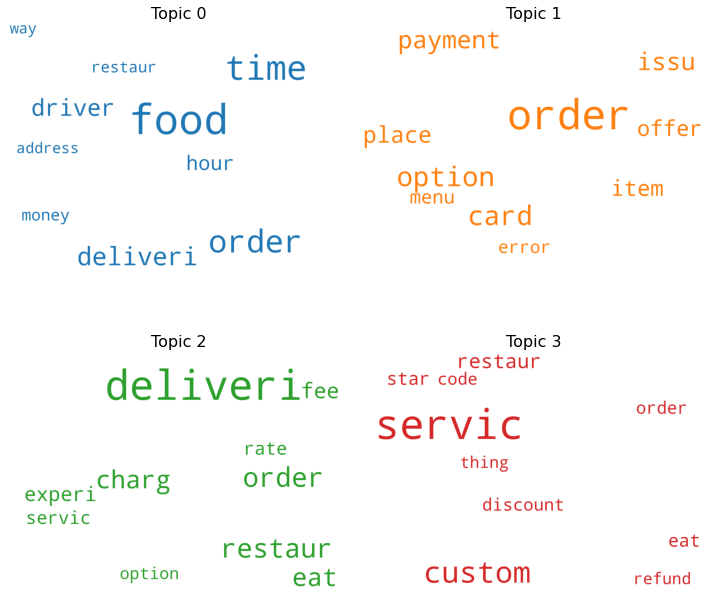

In [20]:
cleaned_data_tm = review_df['cleaned_tm']
dictionary = gensim.corpora.Dictionary(cleaned_data_tm)
#Filtering the tokens availables in less than 5 reviews 
dictionary.filter_extremes(no_below=10, no_above=0.5, keep_n=100000)
#Bag of Words Corpus: appearance of words and frequency
bow_corpus = [dictionary.doc2bow(doc) for doc in cleaned_data_tm]
#LDA MODEL with BOW
lda_model = gensim.models.LdaMulticore(bow_corpus, num_topics=4, id2word=dictionary, passes=15)
for idx, topic in lda_model.print_topics(-1):
    print('Topic: {} \nWords: {}'.format(idx, topic))
    
#ADD THE TOPIC TAGS TO THE REVIEW DATAFRAME
topics = []
for review in review_df['cleaned_tm']:
    bow = dictionary.doc2bow(review)
    t = lda_model.get_document_topics(bow)
    topics.append(max(t,key=lambda item:item[1])[0]) #Add which topic is more likely
review_df['topic'] = topics
        
#VISUALIZATION

    
#Word Cloud of Topics
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                      background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()


        


In [21]:
review_df

,raw_review,score,date,app_name,real_tag,cleaned_tm,cleaned_sa,topic
0,Service charge too dear. Normally quick delive...,3,2021-03-29 19:50:03,com.ubercab.eats,1,"[servic, charg, deliveri]",service charge dear normally quick delivery ap...,2
1,Works fine,5,2021-03-20 21:31:18,com.deliveroo.orderapp,1,[work],works fine,3
2,Good app and company but sometimes very rarely...,3,2021-04-01 03:57:14,com.ubercab.eats,1,"[compani, driver, food]",good app company sometimes rarely drivers suck...,0
3,The checkout page is really slow,3,2021-03-31 18:06:41,com.justeat.app.uk,1,"[checkout, page]",checkout page really slow,3
4,Offers make it better than just eat.,4,2021-03-20 19:40:53,com.deliveroo.orderapp,1,"[offer, eat]",offers make better,1
...,...,...,...,...,...,...,...,...
12150,Worst service. I have placed my order and wait...,1,2021-03-25 14:13:21,com.deliveroo.orderapp,0,"[servic, order, hour, order, custom, servic, s...",worst service placed order waiting hour delive...,0
12151,"Good selection, but delivery is expensive and ...",2,2020-08-21 13:29:59,com.deliveroo.orderapp,0,"[select, deliveri, checkout, everyth]",good selection delivery expensive warned check...,1
12152,It is fraud sales... Items which u ordered wil...,1,2021-04-04 17:31:08,com.application.zomato,0,"[fraud, sale, item, order, anyth, order, punja...",fraud sales items ordered delivered dont order...,1
12153,I pay for the food and they shown it delivered...,1,2021-03-11 14:01:04,com.deliveroo.orderapp,0,"[pay, food, anyth]",pay food shown delivered get anything,0


In [22]:
#Counts of the toics
review_df['topic'].value_counts()

0    4286
3    2923
2    2829
1    2117
Name: topic, dtype: int64

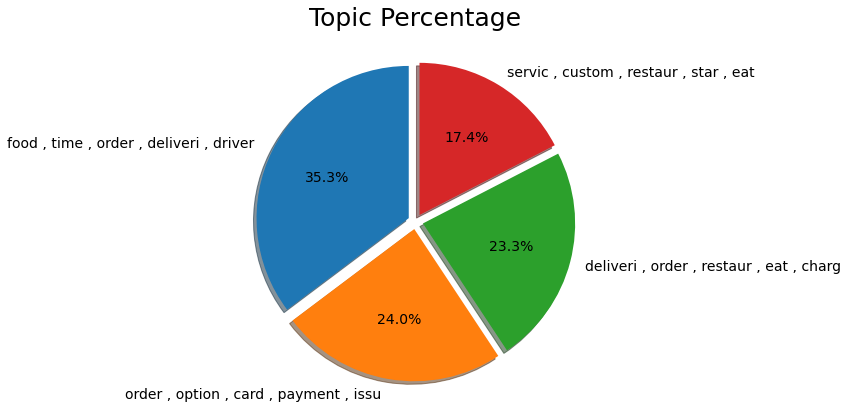

In [23]:
#Topic Percentages
#Getting 5 most important words in  each topic
topics = lda_model.print_topics(-1)
labels = []
for topic in topics:
    process1 = [re.sub("[^a-zA-Z\d\s:]", "", w) for w in topic[1].split("+")]
    process2 = [re.sub("[\d-]", "", w) for w in process1]
    labels.append(",".join(process2[:5]))
    
counts = list(review_df['topic'].value_counts())
explode = (0.05, 0.05, 0.05, 0.05)



# visual
plt.figure(figsize = (7,7))
plt.pie(counts, explode=explode, labels=labels, autopct='%1.1f%%',textprops={'fontsize': 14}, shadow=True, startangle = 90)
plt.title('Topic Percentage',color = 'black', fontsize = 25)

plt.show()

Sentiment Per Topic (real tags, ratings 1,2 = neg 3,4,5 = pos)

In [24]:

#Uber Eats
apps = [['UberEats', 'com.ubercab.eats'], ['Zomato',"com.application.zomato"], ['Deliveroo','com.deliveroo.orderapp'], ['JustEat', 'com.justeat.app.uk']]
for app in apps:
    app_df = review_df[review_df['app_name'] == app[1]]
    app_topic_counts = []
    for i in range(4):
        topic_filtered = app_df[app_df['topic'] == i]
        app_topic_counts.append(list(topic_filtered['real_tag'].value_counts()))

    sentiment_tag =['positive', 'negative']
    explode = (0.05, 0.05)

    fig = plt.figure(figsize=(18,10), dpi=1600)
    #2 rows 2 cols
    #first row, first col
    ax1 = plt.subplot2grid((2,2),(0,0))
    plt.pie(app_topic_counts[0], labels = sentiment_tag, autopct='%1.1f%%',textprops={'fontsize': 11}, startangle = 90)
    plt.title(labels[0])
    #first row sec col
    ax1 = plt.subplot2grid((2,2), (0, 1))
    plt.pie(app_topic_counts[1],labels = sentiment_tag, autopct='%1.1f%%',textprops={'fontsize': 11}, startangle = 90)
    plt.title(labels[1])
    #Second row first column
    ax1 = plt.subplot2grid((2,2), (1, 0))
    plt.pie(app_topic_counts[2],labels = sentiment_tag, autopct='%1.1f%%',textprops={'fontsize': 11}, startangle = 90)
    plt.title(labels[2])
    #second row second column
    ax1 = plt.subplot2grid((2,2), (1, 1))
    plt.pie(app_topic_counts[3],labels = sentiment_tag, autopct='%1.1f%%',textprops={'fontsize': 11}, startangle = 90)
    plt.title(labels[3])

    fig.suptitle(app[0], fontsize = 20 )
    plt.show()




/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


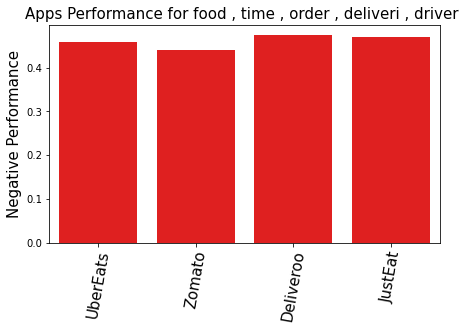

/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


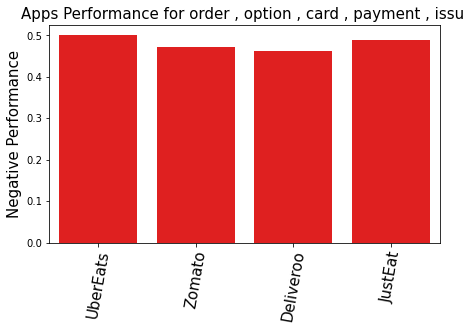

/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


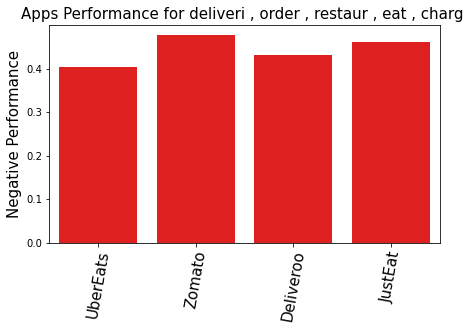

/Users/sevde/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


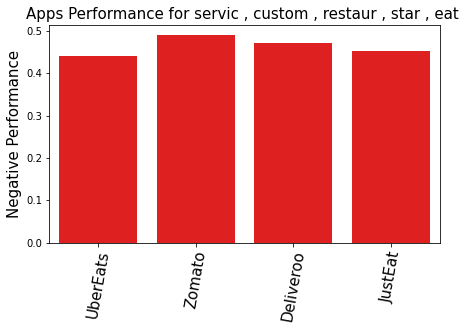

In [39]:
#Visualising the apps' negative ratios for ach topic 

import plotly.express as px
#Uber Eats
apps = [['UberEats', 'com.ubercab.eats'], ['Zomato',"com.application.zomato"], ['Deliveroo','com.deliveroo.orderapp'], ['JustEat', 'com.justeat.app.uk']]


for i in range(4):
    
    topic_df = review_df[review_df['topic'] == i]
    app_topic_counts = []
    for app in apps:
        app_filtered = topic_df[topic_df['app_name'] == app[1]]
        app_topic_counts.append(list(app_filtered['real_tag'].value_counts()))


    pos_counts = [count[0] for count in app_topic_counts]
    neg_counts = [count[1] for count in app_topic_counts]
    neg_ratio = [count[1]/(count[0]+count[1]) for count in app_topic_counts]
    pos_ratio = [count[0]/(count[0]+count[1]) for count in app_topic_counts]
    
    plt.figure(figsize=(7,4))
    plot = sns.barplot(np.arange(4), neg_ratio, color = 'r') #width=0.35)
    plt.ylabel('Negative Performance',fontsize=15)
    plt.xticks(np.arange(4), [app[0] for app in apps], fontsize=15, rotation=80)
    plt.title('Apps Performance for '+labels[i], fontsize=15)
    plt.show()

   